In [10]:
import numpy as np
from keras import layers
from keras import models
from keras import optimizers
import matplotlib.pyplot as plt
from tensorflow.keras.utils import load_img
from tensorflow.keras.utils import img_to_array
from PIL import Image
import shutil
from sklearn.model_selection import train_test_split
import glob
import tensorflow as tf


In [11]:
dir =  "/content/PetImages/PetImages"

In [12]:
#Pasar de zip a no zip
shutil.unpack_archive("/content/PetImages.zip","PetImages")

In [13]:
def TrainTestValGenerator(n_subset,img_height, img_width) : 
  mydir = dir + "/Cat/"
  file_list_cat = glob.glob(mydir + "/*.jpg")
  print('file_list {}'.format(len(file_list_cat)))
  mydir =  dir + "/Dog/"
  file_list_dog = glob.glob(mydir + "/*.jpg")
  print('file_list {}'.format(len(file_list_dog)))

  image_list_dogs = []
  image_list_cats = []
  image_list_all = []
  for path in file_list_dog[:n_subset] : 
    #try :
    image_list_dogs.append(np.asarray(Image.open(path).resize((img_height,img_width)).convert('RGB')).astype('float32')/255)
    #except :  
    #  print(path)
  for path in file_list_cat[:n_subset] : 
    image_list_cats.append(np.asarray(Image.open(path).resize((img_height,img_width)).convert('RGB')).astype('float32')/255)
  image_list_all = image_list_cats + image_list_dogs
  del image_list_cats, image_list_dogs, file_list_dog,file_list_cat
  labels = []
  #cats : 0 || dogs : 1
  labels[:n_subset] = [[0]] * n_subset
  labels[n_subset:] = [[1]] * n_subset
  xtrain,xtest,ytrain,ytest = train_test_split(np.asarray(image_list_all),np.asarray(labels),test_size=0.10)
  del image_list_all
  xtrain,xval,ytrain,yval = train_test_split(xtrain,ytrain,test_size=0.10)
  return xtrain,xtest,xval,ytrain,ytest,yval

In [14]:
img_width = 200
img_height = 200
n_subset = 2000
xtrain,xtest,xval,ytrain,ytest,yval = TrainTestValGenerator(n_subset, img_height, img_width )

file_list 2001
file_list 2002


In [15]:
learning_rate = 0.0001
model = models.Sequential()

#CNN
model.add(layers.Conv2D(32,(3,3), activation='relu', input_shape=(img_width,img_height,3)))
model.add(layers.MaxPooling2D((2,2)))

model.add(layers.Conv2D(64,(3,3), activation='relu'))
model.add(layers.MaxPooling2D((2,2)))

# model.add(layers.Conv2D(64,(3,3), activation='relu'))
# model.add(layers.MaxPooling2D((2,2)))

# model.add(layers.Conv2D(64,(3,3), activation='relu'))
# model.add(layers.MaxPooling2D((2,2)))


model.add(layers.Flatten())
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(1, activation='sigmoid'))
model.summary()
model.compile( loss = 'binary_crossentropy',              
              optimizer = optimizers.Adam(lr = learning_rate),
              metrics=['acc'])

history = model.fit(
    xtrain, ytrain,
    epochs= 20,
    validation_data = (xval, yval))

model.save('CNN.h5')

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 198, 198, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 99, 99, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 97, 97, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 48, 48, 64)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 147456)            0         
                                                                 
 dense (Dense)               (None, 32)                4

/usr/local/lib/python3.7/dist-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/20
102/102 [==============================] - 14s 47ms/step - loss: 0.6826 - acc: 0.5611 - val_loss: 0.6630 - val_acc: 0.5750
Epoch 2/20
102/102 [==============================] - 4s 42ms/step - loss: 0.6415 - acc: 0.6265 - val_loss: 0.6739 - val_acc: 0.5528
Epoch 3/20
102/102 [==============================] - 4s 43ms/step - loss: 0.5929 - acc: 0.6985 - val_loss: 0.6004 - val_acc: 0.6722
Epoch 4/20
102/102 [==============================] - 4s 42ms/step - loss: 0.5594 - acc: 0.7241 - val_loss: 0.5763 - val_acc: 0.7028
Epoch 5/20
102/102 [==============================] - 4s 42ms/step - loss: 0.5245 - acc: 0.7485 - val_loss: 0.5651 - val_acc: 0.7250
Epoch 6/20
102/102 [==============================] - 4s 42ms/step - loss: 0.4868 - acc: 0.7787 - val_loss: 0.5507 - val_acc: 0.7306
Epoch 7/20
102/102 [==============================] - 4s 42ms/step - loss: 0.4560 - acc: 0.8086 - val_loss: 0.5644 - val_acc: 0.7000
Epoch 8/20
102/102 [==============================] - 4s 42ms/step -

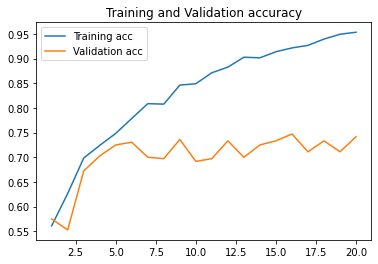

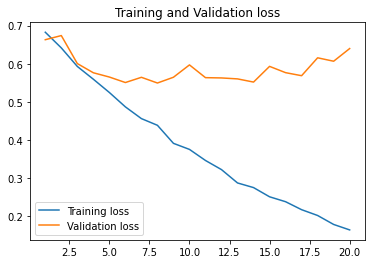

In [16]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range (1, len(acc) +1 )


#Plot acc
plt.plot(epochs, acc, label='Training acc')
plt.plot(epochs, val_acc, label='Validation acc')
plt.title ('Training and Validation accuracy')
plt.legend()

plt.figure()
plt.plot(epochs, loss, label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title ('Training and Validation loss')
plt.legend()
plt.show()


In [17]:
layer_names = [layer.name for layer in model.layers]
layer_names

['conv2d',
 'max_pooling2d',
 'conv2d_1',
 'max_pooling2d_1',
 'flatten',
 'dense',
 'dropout',
 'dense_1']

In [18]:
layer_outputs = [layer.output for layer in model.layers]
layer_outputs 

[<KerasTensor: shape=(None, 198, 198, 32) dtype=float32 (created by layer 'conv2d')>,
 <KerasTensor: shape=(None, 99, 99, 32) dtype=float32 (created by layer 'max_pooling2d')>,
 <KerasTensor: shape=(None, 97, 97, 64) dtype=float32 (created by layer 'conv2d_1')>,
 <KerasTensor: shape=(None, 48, 48, 64) dtype=float32 (created by layer 'max_pooling2d_1')>,
 <KerasTensor: shape=(None, 147456) dtype=float32 (created by layer 'flatten')>,
 <KerasTensor: shape=(None, 32) dtype=float32 (created by layer 'dense')>,
 <KerasTensor: shape=(None, 32) dtype=float32 (created by layer 'dropout')>,
 <KerasTensor: shape=(None, 1) dtype=float32 (created by layer 'dense_1')>]

In [19]:
feature_map_model = tf.keras.models.Model(inputs=model.input, outputs=layer_outputs)
mydir =  dir + "/Cat/"
file_list_cat = glob.glob(mydir + "/*7.jpg")
input = (np.asarray(Image.open(file_list_cat[1]).resize((img_height,img_width)).convert("RGB")).astype('float32')/255)
input = input.reshape((1,) + input.shape)                   
feature_maps = feature_map_model.predict(input)
for layer_name, feature_map in zip(layer_names, feature_maps):print(f"The shape of the {layer_name} is =======>> {feature_map.shape}")

1/1 [==============================] - 0s 135ms/step
The shape of the conv2d is =======>> (1, 198, 198, 32)
The shape of the max_pooling2d is =======>> (1, 99, 99, 32)
The shape of the conv2d_1 is =======>> (1, 97, 97, 64)
The shape of the max_pooling2d_1 is =======>> (1, 48, 48, 64)
The shape of the flatten is =======>> (1, 147456)
The shape of the dense is =======>> (1, 32)
The shape of the dropout is =======>> (1, 32)
The shape of the dense_1 is =======>> (1, 1)


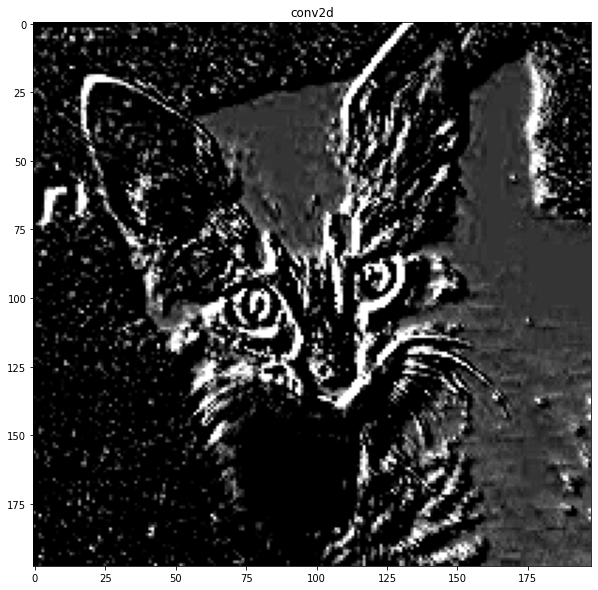

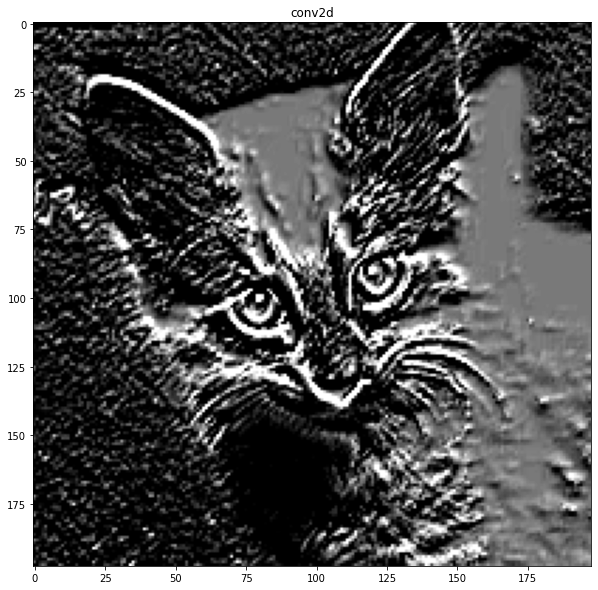

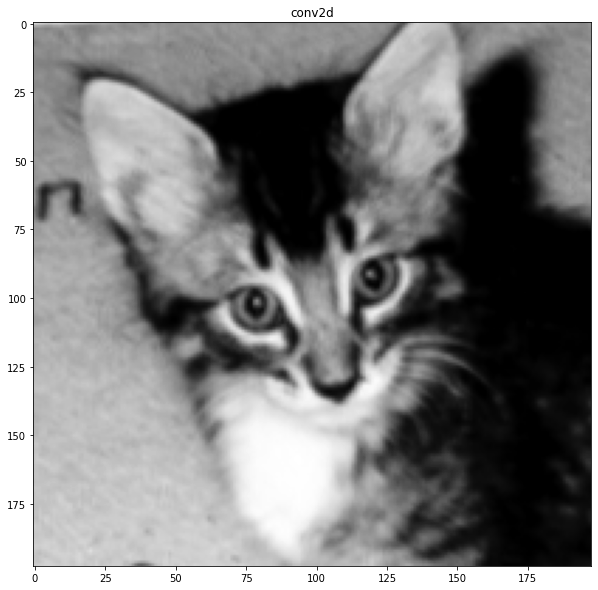

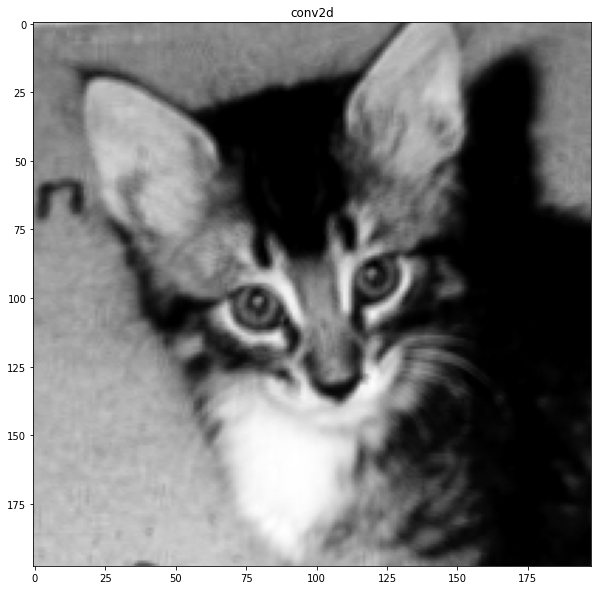

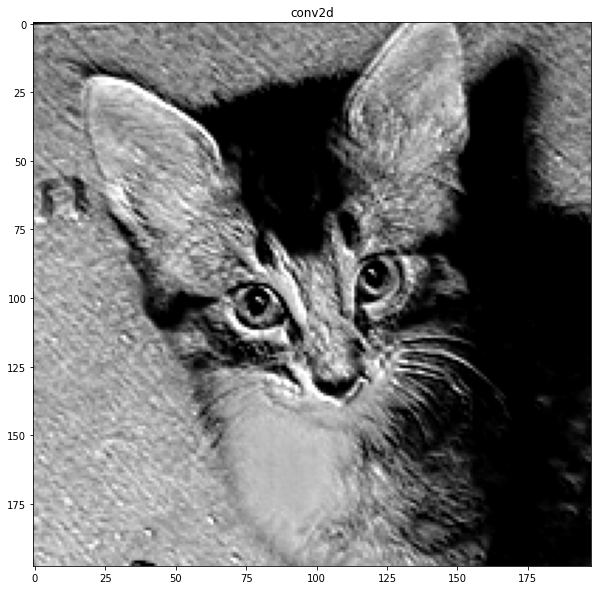

...

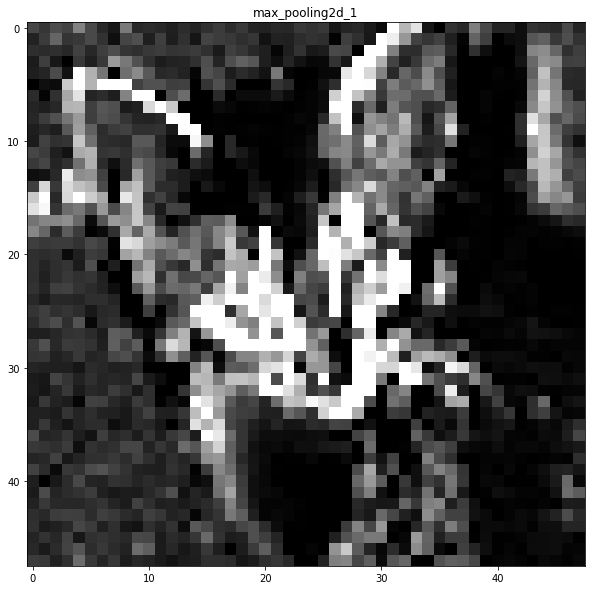

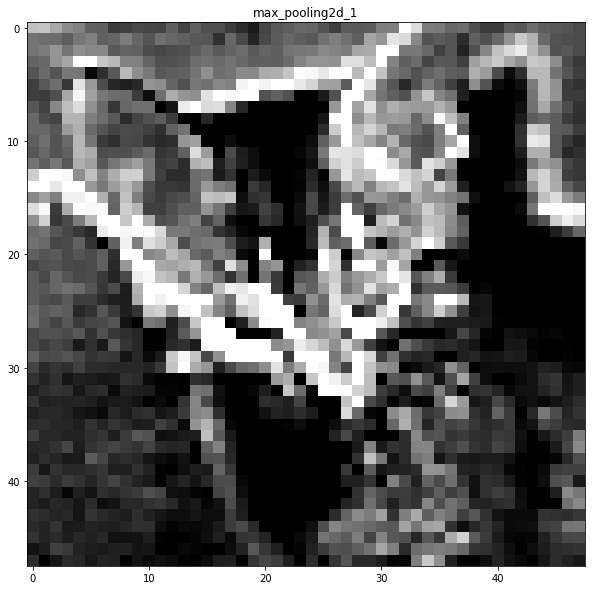

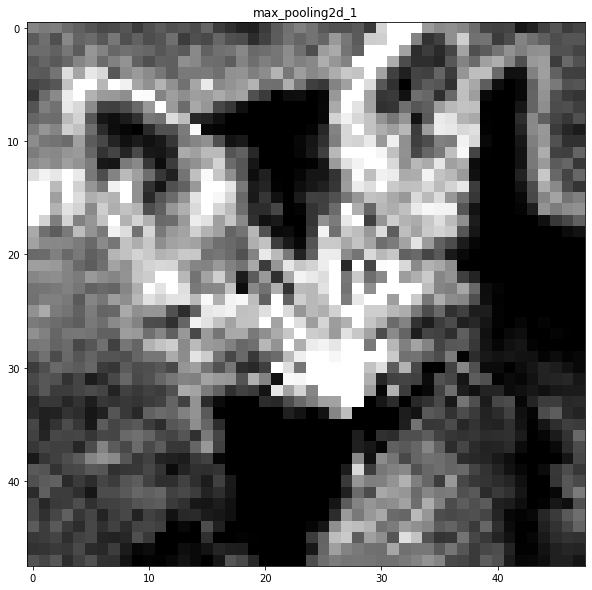

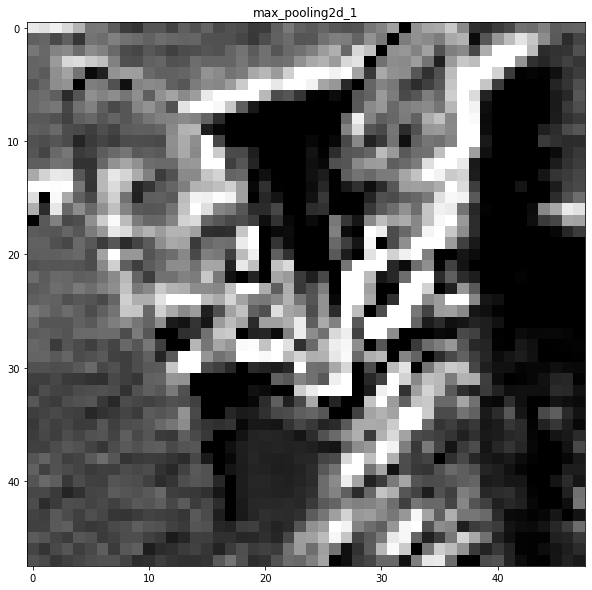

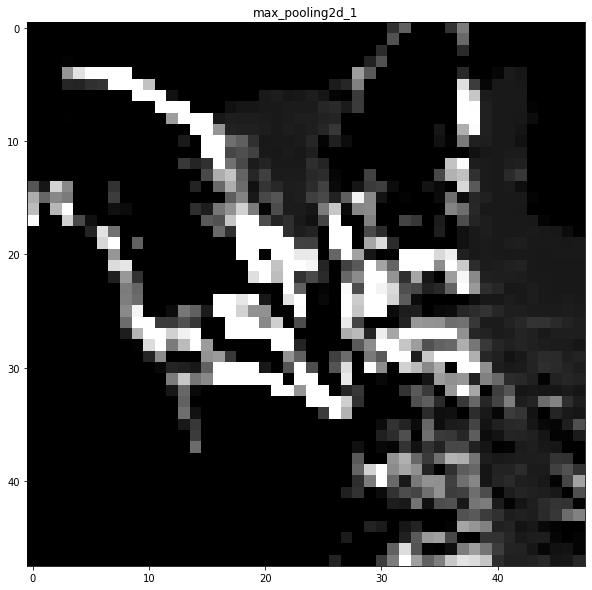

In [20]:
for layer_name, feature_map in zip(layer_names, feature_maps):
  if(len(feature_map.shape) == 4):
    k = feature_map.shape[-1]
    size=feature_map.shape[1]
    for i in range(k):
      feature_image = feature_map[0, :, :, i]
      feature_image-= feature_image.mean()
      feature_image/= feature_image.std ()
      feature_image*=  64
      feature_image+= 128
      feature_image= np.clip(feature_image, 0, 255).astype('uint8')
      scale = 10. / k
      plt.figure( figsize=(scale * k, scale*k) )
      plt.title ( layer_name )
      plt.grid  ( False )
      plt.imshow( feature_image, aspect='auto', cmap='gray')
      plt.show()

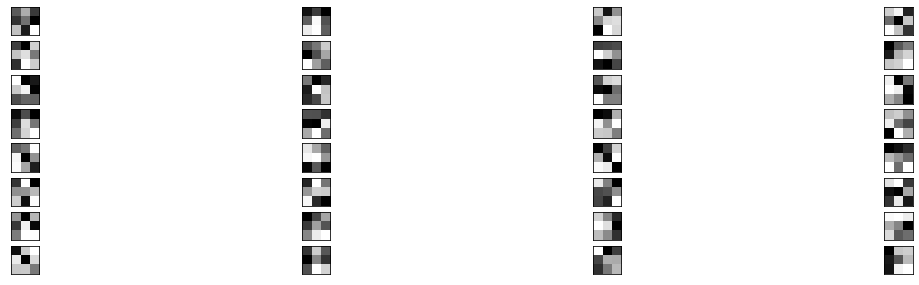

In [21]:
filters, biases = model.layers[0].get_weights()
f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)
n_filters, ix = 32, 1
plt.figure(figsize= (20,20))
for i in range(n_filters):
	f = filters[:, :, :, i]
	# plot each channel separately
	for j in range(1):
	  ax = plt.subplot(n_filters, 4, ix)
	  ax.set_xticks([])
	  ax.set_yticks([])
	  plt.imshow(f[:, :, j], cmap='gray')
	  ix += 1
# show the figure
plt.show()

**VGC16**

In [22]:
from keras.applications import VGG16

num_channels = 3
img_input = layers.Input(shape=(img_height, img_width, num_channels)) 
conv_base = VGG16( weights='imagenet', include_top=False, input_tensor = img_input )

model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(1, activation='sigmoid'))
model.summary()

58889256/58889256 [==============================] - 0s 0us/step
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 6, 6, 512)         14714688  
                                                                 
 flatten_1 (Flatten)         (None, 18432)             0         
                                                                 
 dense_2 (Dense)             (None, 32)                589856    
                                                                 
 dropout_1 (Dropout)         (None, 32)                0         
                                                                 
 dense_3 (Dense)             (None, 1)                 33        
                                                                 
Total params: 15,304,577
Trainable params: 15,304,577
Non-trainable params: 0
___________________________________________

In [23]:
# freeze = Activated
conv_base.trainable = False

Epoch 1/20
102/102 [==============================] - 20s 169ms/step - loss: 0.4392 - acc: 0.8037 - val_loss: 0.2991 - val_acc: 0.8778
Epoch 2/20
102/102 [==============================] - 15s 147ms/step - loss: 0.2672 - acc: 0.9000 - val_loss: 0.2414 - val_acc: 0.9056
Epoch 3/20
102/102 [==============================] - 15s 149ms/step - loss: 0.2193 - acc: 0.9176 - val_loss: 0.2200 - val_acc: 0.9139
Epoch 4/20
102/102 [==============================] - 15s 150ms/step - loss: 0.1721 - acc: 0.9380 - val_loss: 0.2013 - val_acc: 0.9222
Epoch 5/20
102/102 [==============================] - 15s 152ms/step - loss: 0.1485 - acc: 0.9503 - val_loss: 0.2301 - val_acc: 0.8944
Epoch 6/20
102/102 [==============================] - 16s 156ms/step - loss: 0.1306 - acc: 0.9574 - val_loss: 0.1859 - val_acc: 0.9250
Epoch 7/20
102/102 [==============================] - 16s 157ms/step - loss: 0.1108 - acc: 0.9679 - val_loss: 0.1820 - val_acc: 0.9250
Epoch 8/20
102/102 [==============================] - 1

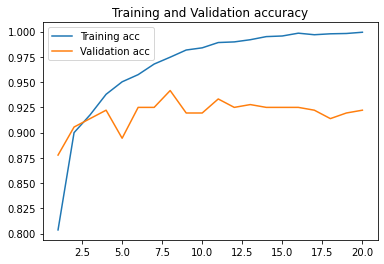

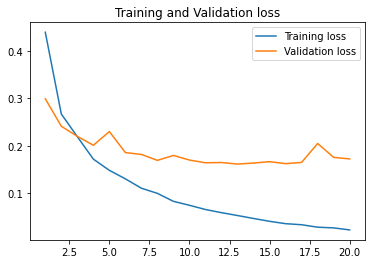

In [24]:
#Freeze true
model.compile( loss = 'binary_crossentropy',              
              optimizer = optimizers.Adam(lr = learning_rate),
              metrics=['acc'])

history = model.fit(
    xtrain, ytrain,
    epochs= 20,
    validation_data = (xval, yval))

model.save('VGC16_freeze.h5')

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range (1, len(acc) +1 )


#Plot acc
plt.plot(epochs, acc, label='Training acc')
plt.plot(epochs, val_acc, label='Validation acc')
plt.title ('Training and Validation accuracy')
plt.legend()

plt.figure()
plt.plot(epochs, loss, label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title ('Training and Validation loss')
plt.legend()
plt.show()

In [25]:
# freeze = Deactivated

conv_base.trainable = True
for layer in conv_base.layers:
  if layer.name == 'block5_conv1':
    layer.trainable = True
  else:
    layer.trainable = False

Epoch 1/20
102/102 [==============================] - 18s 166ms/step - loss: 0.0409 - acc: 0.9855 - val_loss: 0.1581 - val_acc: 0.9250
Epoch 2/20
102/102 [==============================] - 18s 174ms/step - loss: 0.0358 - acc: 0.9877 - val_loss: 0.1486 - val_acc: 0.9500
Epoch 3/20
102/102 [==============================] - 17s 163ms/step - loss: 0.0048 - acc: 0.9991 - val_loss: 0.1661 - val_acc: 0.9528
Epoch 4/20
102/102 [==============================] - 17s 162ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 0.1800 - val_acc: 0.9556
Epoch 5/20
102/102 [==============================] - 16s 162ms/step - loss: 6.7276e-04 - acc: 1.0000 - val_loss: 0.1783 - val_acc: 0.9556
Epoch 6/20
102/102 [==============================] - 17s 162ms/step - loss: 7.0867e-04 - acc: 1.0000 - val_loss: 0.2032 - val_acc: 0.9528
Epoch 7/20
102/102 [==============================] - 17s 162ms/step - loss: 7.8679e-04 - acc: 1.0000 - val_loss: 0.1804 - val_acc: 0.9528
Epoch 8/20
102/102 [=======================

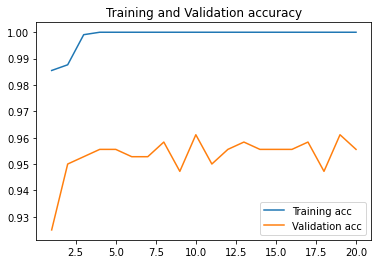

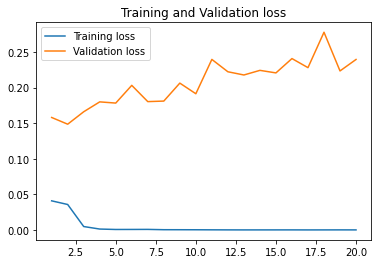

In [26]:
#Freeze false
model.compile( loss = 'binary_crossentropy',              
              optimizer = optimizers.Adam(lr = learning_rate),
              metrics=['acc'])

history = model.fit(
    xtrain, ytrain,
    epochs= 20,
    validation_data = (xval, yval))

model.save('VGC16_unfreeze.h5')

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range (1, len(acc) +1 )


#Plot acc
plt.plot(epochs, acc, label='Training acc')
plt.plot(epochs, val_acc, label='Validation acc')
plt.title ('Training and Validation accuracy')
plt.legend()

plt.figure()
plt.plot(epochs, loss, label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title ('Training and Validation loss')
plt.legend()
plt.show()